1. The dataset you will use consists of tweets collected from the Twitter API during the
   period June 1st to June 30th 2022.
2. These tweets were collected by applying a geographical filter to return only tweets in Europe.
3. The bounding box used is specified by (longitude,latitude) coordinates.The lower-left corner is at (-24.5, 34.8)
    and the upper-right is at (69.1, 81.9). Assume this box defines “Europe”


HINT: Look at the json and zipfile modules in Python for processing the tweets.
HINT: One of the challenges with this coursework is handling large data files. You
       may wish to think about your strategy. The JSON files contain a lot of redundant
        information. A good data management strategy will require less storage and make
       the files quicker to process.
HINT: Check correctness, don’t assume it. Look at the JSON objects carefully.
       Check things like timestamps and mandatory fields for consistency.

In [1]:
import json
import plotly

import time
from itertools import chain
from multiprocessing.pool import Pool

import zip_extractornew
from  zip_extractornew import (dir_list, zip_tweet_operator,ques_op2,ques_op3,ques_op23,ques_op24,ques_op3_3,ques_op4_4) #,ques_op23,con_iso2 ) #, ques_op3, con_iso2,question_1
from  zip_extractornew import (dir_list, zip_tweet_operator1)


from collections import Counter

import pandas as pd
import reverse_geocoder as rg
from country_converter import convert as iso2_to_name


from plotly import express as px


In [2]:
#i want before removing duplicates
def intialdata(chain_iter):      #removes duplicates of a given key
    return tuple(filter(lambda x: x, (chain(*chain_iter))))

In [6]:
def removedup(chain_iter):          #removes duplicates (Property of set:- A set does not have duplicates)
    return tuple(filter(lambda x: x, set(chain(*chain_iter))))

Question 1  Count the total number of tweets, describing how you deal with duplicates or
other anomalies in the data set. [5 marks]


In [33]:
import os
os.getcwd()
os.chdir(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment")
os.getcwd()

'D:\\UOE MODULES PYTHON DIRECTORy_codes\\IDS\\assignment'

In [34]:

if __name__ == "__main__": # Pool works only when using this if statement
    t = time.time()
    with Pool(6) as pool:
        # print(list_of_zip_folders[0])
        question1 = pool.map(zip_tweet_operator, dir_list(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment\twitter_data"))
    print((time.time() - t)/60)

7.3569710890452065


In [35]:
type(question1)
question1[0:10]

[((1531772510450208769, 'Tue May 31 23:00:00 +0000 2022'),
  (1531772510701748225, 'Tue May 31 23:00:00 +0000 2022'),
  (1531772513306525696, 'Tue May 31 23:00:00 +0000 2022'),
  (1531772513809842176, 'Tue May 31 23:00:00 +0000 2022'),
  (1531772514262831104, 'Tue May 31 23:00:01 +0000 2022'),
  (1531772514749366274, 'Tue May 31 23:00:01 +0000 2022'),
  (1531772515672006656, 'Tue May 31 23:00:01 +0000 2022'),
  (1531772516359864320, 'Tue May 31 23:00:01 +0000 2022'),
  (1531772515806326786, 'Tue May 31 23:00:01 +0000 2022'),
  (1531772516049780737, 'Tue May 31 23:00:01 +0000 2022'),
  (1531772517534294018, 'Tue May 31 23:00:01 +0000 2022'),
  (1531772517978865665, 'Tue May 31 23:00:01 +0000 2022'),
  (1531772518041849858, 'Tue May 31 23:00:01 +0000 2022'),
  (1531772519182647296, 'Tue May 31 23:00:02 +0000 2022'),
  (1531772519065300992, 'Tue May 31 23:00:02 +0000 2022'),
  (1531772519723814912, 'Tue May 31 23:00:02 +0000 2022'),
  (1531772520059346948, 'Tue May 31 23:00:02 +0000 2022'

No of tweets in the dataset

In [36]:
len(intialdata(question1))   #with duplicates(No None)    #15040387

15040387

(Describe how to deal with duplicates:- (what makes a tweets unique)
Since, every user make an individual tweets can be consider as unique tweets. The tweets IDs must be a primary key
in a dataset. Thus, it is important to remove the duplicates.

Unique tweets(no. of tweets)  :- 15033548

In [37]:
len(lister(question1))     ##without duplicates

15033548

In [ ]:
no_of_unique_tweets = removedup(question1)
len(no_of_unique_tweets)

2) Plot a time-series of the number of tweets by day using the whole dataset and
comment on what you see. [5 marks]



In [ ]:
no_of_unique_tweets[0:1]

In [ ]:
import pandas as pd
data1 = pd.DataFrame(no_of_unique_tweets , columns  =["tweets_id","created_date"])
data1.head()
data1.shape

In [41]:
data1[['created_date']] = data1[['created_date']].apply(pd.to_datetime)   # # always do this date column
# data1['created_date'] = pd.to_datetime(data1['created_date'])
data1.head()
# data1.set_index('created_date')

,tweets_id,created_date
0,1533453750857347072,2022-06-05 14:20:39+00:00
1,1536002100127318016,2022-06-12 15:06:52+00:00
2,1538658787275550720,2022-06-19 23:03:36+00:00
3,1532044615926292481,2022-06-01 17:01:15+00:00
4,1542118170047250432,2022-06-29 12:09:57+00:00


In [42]:
data1.to_csv(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment\export files\data1.csv")

In [43]:
os.getcwd()

'D:\\UOE MODULES PYTHON DIRECTORy_codes\\IDS\\assignment'

In [44]:
data1['time_local'] = data1['created_date'].dt.tz_convert('Europe/London')
data1.head()

,tweets_id,created_date,time_local
0,1533453750857347072,2022-06-05 14:20:39+00:00,2022-06-05 15:20:39+01:00
1,1536002100127318016,2022-06-12 15:06:52+00:00,2022-06-12 16:06:52+01:00
2,1538658787275550720,2022-06-19 23:03:36+00:00,2022-06-20 00:03:36+01:00
3,1532044615926292481,2022-06-01 17:01:15+00:00,2022-06-01 18:01:15+01:00
4,1542118170047250432,2022-06-29 12:09:57+00:00,2022-06-29 13:09:57+01:00


In [45]:
print(data1['time_local'].agg(['min', 'max']))
data1['day']= data1['time_local'].dt.day  #day
data1.head()

min   2022-06-01 00:00:00+01:00
max   2022-06-30 23:59:59+01:00
Name: time_local, dtype: datetime64[ns, Europe/London]


,tweets_id,created_date,time_local,day
0,1533453750857347072,2022-06-05 14:20:39+00:00,2022-06-05 15:20:39+01:00,5
1,1536002100127318016,2022-06-12 15:06:52+00:00,2022-06-12 16:06:52+01:00,12
2,1538658787275550720,2022-06-19 23:03:36+00:00,2022-06-20 00:03:36+01:00,20
3,1532044615926292481,2022-06-01 17:01:15+00:00,2022-06-01 18:01:15+01:00,1
4,1542118170047250432,2022-06-29 12:09:57+00:00,2022-06-29 13:09:57+01:00,29


In [46]:
data2 = data1.groupby(['day'])['tweets_id'].agg('count').reset_index()
print(data2.tail())
data2.columns

    day  tweets_id
25   26     504845
26   27     486342
27   28     508754
28   29     510783
29   30     508935


Index(['day', 'tweets_id'], dtype='object')

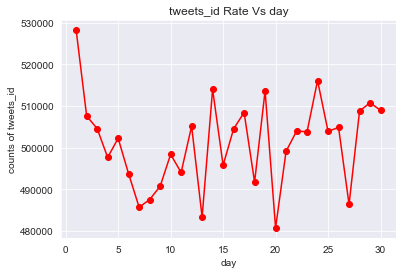

In [47]:
import matplotlib.pyplot as plt
plt.plot(data2["day"], data2["tweets_id"],color='red', marker='o')
plt.title('tweets_id Rate Vs day')
plt.xlabel('day')
plt.ylabel('counts of tweets_id')
plt.xlim([0,24])
plt.show()

Question 3. Use box and whisker diagrams to compare the average number of tweets on
weekdays to the numbers for weekend days.
Are there statistically significant differences between the number of tweets on weekdays and weekends? [5
marks]

In [48]:
data1.head()
data1.weekday_weekend.value_counts()

AttributeError: 'DataFrame' object has no attribute 'weekday_weekend'

In [49]:
data1.head()
data1["dayofweek"] = data1['time_local'].dt.dayofweek  #day of that week
data1.head()
# data1.dayofweek.value_counts()

,tweets_id,created_date,time_local,day,dayofweek
0,1533453750857347072,2022-06-05 14:20:39+00:00,2022-06-05 15:20:39+01:00,5,6
1,1536002100127318016,2022-06-12 15:06:52+00:00,2022-06-12 16:06:52+01:00,12,6
2,1538658787275550720,2022-06-19 23:03:36+00:00,2022-06-20 00:03:36+01:00,20,0
3,1532044615926292481,2022-06-01 17:01:15+00:00,2022-06-01 18:01:15+01:00,1,2
4,1542118170047250432,2022-06-29 12:09:57+00:00,2022-06-29 13:09:57+01:00,29,2


In [50]:
data1.loc[(data1['dayofweek'].isin([5,6]) ), 'weekday_weekend'] = 'weekend'
data1.loc[(data1['dayofweek'].isin([0,1,2,3,4]) ), 'weekday_weekend'] = 'weekday'
data1.head(10)

,tweets_id,created_date,time_local,day,dayofweek,weekday_weekend
0,1533453750857347072,2022-06-05 14:20:39+00:00,2022-06-05 15:20:39+01:00,5,6,weekend
1,1536002100127318016,2022-06-12 15:06:52+00:00,2022-06-12 16:06:52+01:00,12,6,weekend
2,1538658787275550720,2022-06-19 23:03:36+00:00,2022-06-20 00:03:36+01:00,20,0,weekday
3,1532044615926292481,2022-06-01 17:01:15+00:00,2022-06-01 18:01:15+01:00,1,2,weekday
4,1542118170047250432,2022-06-29 12:09:57+00:00,2022-06-29 13:09:57+01:00,29,2,weekday
5,1542258249810034688,2022-06-29 21:26:35+00:00,2022-06-29 22:26:35+01:00,29,2,weekday
6,1542153641515257856,2022-06-29 14:30:54+00:00,2022-06-29 15:30:54+01:00,29,2,weekday
7,1533736791710236672,2022-06-06 09:05:21+00:00,2022-06-06 10:05:21+01:00,6,0,weekday
8,1537107692715638784,2022-06-15 16:20:06+00:00,2022-06-15 17:20:06+01:00,15,2,weekday
9,1532356926360768515,2022-06-02 13:42:15+00:00,2022-06-02 14:42:15+01:00,2,3,weekday


In [51]:
#dividing into two datsets
print(data1["weekday_weekend"].value_counts())
df_weekdays = data1.loc[(data1["weekday_weekend"] == "weekday")]
print(df_weekdays.shape)  #11020512
df_weekend = data1.loc[(data1["weekday_weekend"] == "weekend")]
df_weekend.shape  #4013036

weekday    11020512
weekend     4013036
Name: weekday_weekend, dtype: int64
(11020512, 6)


(4013036, 6)

In [52]:
###weekdays :- 0
df_weekdays1 = df_weekdays.groupby(['day'])['tweets_id'].agg('count').reset_index()
df_weekdays1["weekend_weekday"] = 0 #weekdays
df_weekdays1.head()

,day,tweets_id,weekend_weekday
0,1,528203,0
1,2,507581,0
2,3,504556,0
3,6,493649,0
4,7,485643,0


In [53]:
##weekend :- 1
df_weekend1 = df_weekend.groupby(['day'])['tweets_id'].agg('count').reset_index()
df_weekend1["weekend_weekday"] = 1 #weekend
df_weekend1.head()

,day,tweets_id,weekend_weekday
0,4,497624,1
1,5,502225,1
2,11,494002,1
3,12,505142,1
4,18,491708,1


Text(0, 0.5, 'count of tweet_id')

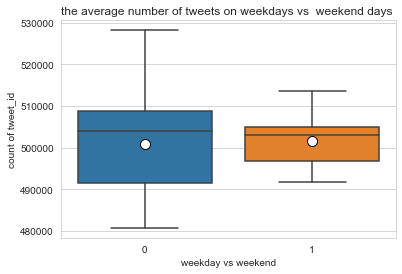

In [54]:
data_3 = pd.concat([df_weekend1,df_weekdays1],axis=0)
data_3
import seaborn as sns
sns.set_style("whitegrid")

ax = sns.boxplot(x="weekend_weekday", y="tweets_id",
                  data=data_3 , showmeans=True ,meanprops={"marker":"o",
                                                            "markerfacecolor":"white",
                                                               "markeredgecolor":"black",
                                                               "markersize":"10"})

ax.set_title('the average number of tweets on weekdays vs  weekend days ')
ax.set_xlabel('weekday vs weekend')
ax.set_ylabel('count of tweet_id')
#black dot is showing the average number of tweets on weekdays and weekend

Are there statistically significant differences between the number of tweets on weekdays and weekends?

There are very less range of tweets during weekends as compare to weekdays. Howver
1) Medians, the “middle” values of each group. It seems like the (median count of tweets) on weekend and weekdays are almost similar.
2) In case of weekdays , it is having larger ranges indicate wider distribution, that is, more number of tweets. In contrats to weekend,there is
   lesser range of count of tweets.
3) Average number of tweets on weekdays and weekends are almost similar.

*****mean is close to median in weekends, not close in weekdays

4. Plot a time-series of the number of tweets by hour, averaged over all weekdays and comment on what you see. [5 marks]


In [55]:
data1.head()
# extracts just the hour
data1['hour'] = data1['time_local'].dt.hour
data1.head()

,tweets_id,created_date,time_local,day,dayofweek,weekday_weekend,hour
0,1533453750857347072,2022-06-05 14:20:39+00:00,2022-06-05 15:20:39+01:00,5,6,weekend,15
1,1536002100127318016,2022-06-12 15:06:52+00:00,2022-06-12 16:06:52+01:00,12,6,weekend,16
2,1538658787275550720,2022-06-19 23:03:36+00:00,2022-06-20 00:03:36+01:00,20,0,weekday,0
3,1532044615926292481,2022-06-01 17:01:15+00:00,2022-06-01 18:01:15+01:00,1,2,weekday,18
4,1542118170047250432,2022-06-29 12:09:57+00:00,2022-06-29 13:09:57+01:00,29,2,weekday,13


In [58]:
##weekdays
df_weekdays2 = data1.loc[data1["weekday_weekend"] == "weekday"]
print(df_weekdays2.shape)  #(11020512, 7)
df_weekdays2.head()

(11020512, 7)


,tweets_id,created_date,time_local,day,dayofweek,weekday_weekend,hour
2,1538658787275550720,2022-06-19 23:03:36+00:00,2022-06-20 00:03:36+01:00,20,0,weekday,0
3,1532044615926292481,2022-06-01 17:01:15+00:00,2022-06-01 18:01:15+01:00,1,2,weekday,18
4,1542118170047250432,2022-06-29 12:09:57+00:00,2022-06-29 13:09:57+01:00,29,2,weekday,13
5,1542258249810034688,2022-06-29 21:26:35+00:00,2022-06-29 22:26:35+01:00,29,2,weekday,22
6,1542153641515257856,2022-06-29 14:30:54+00:00,2022-06-29 15:30:54+01:00,29,2,weekday,15


In [57]:
###mean of  number of tweets
df_weekdays1.head()

,day,tweets_id,weekend_weekday
0,1,528203,0
1,2,507581,0
2,3,504556,0
3,6,493649,0
4,7,485643,0


In [81]:
####TAKING ALL data
print(data1.shape)
data1.head()
# data1["hour"].value_counts()

(15033548, 7)


,tweets_id,created_date,time_local,day,dayofweek,weekday_weekend,hour
0,1537946715885514752,2022-06-17 23:54:05+00:00,2022-06-18 00:54:05+01:00,18,5,weekend,0
1,1537462275140984833,2022-06-16 15:49:05+00:00,2022-06-16 16:49:05+01:00,16,3,weekday,16
2,1532425778490658824,2022-06-02 18:15:51+00:00,2022-06-02 19:15:51+01:00,2,3,weekday,19
3,1536802603568451590,2022-06-14 20:07:47+00:00,2022-06-14 21:07:47+01:00,14,1,weekday,21
4,1534917343213768705,2022-06-09 15:16:26+00:00,2022-06-09 16:16:26+01:00,9,3,weekday,16


In [67]:
df_weekdays_3 = df_weekdays2.groupby('hour').agg(num_twt = ('tweets_id','nunique')).reset_index()
df_weekdays_3.head()

,hour,num_twt
0,0,210455
1,1,112757
2,2,76348
3,3,71075
4,4,102802


In [74]:
##final
########Experiment 1 for 1.4 :- considering all data then (avg of no of tweets) by hour [by group by method] :- dummy
import numpy as np
data_14 = df_weekdays_3.groupby(['hour'])['num_twt'].agg(np.mean).reset_index()
# data_14.rename(columns = {"tweets_id":"tweets_id_sum"},inplace = True)
data_14.head()

,hour,num_twt
0,0,210455.0
1,1,112757.0
2,2,76348.0
3,3,71075.0
4,4,102802.0


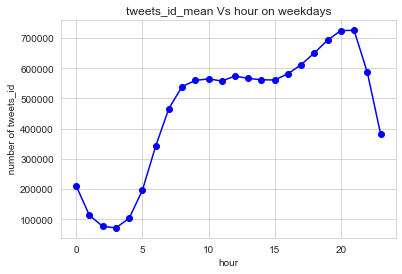

In [73]:
import matplotlib.pyplot as plt
plt.plot(data_14["hour"], data_14["num_twt"],color='blue', marker='o')
plt.title('tweets_id_mean Vs hour on weekdays')
plt.xlabel('hour')
plt.ylabel('Average of tweets_id')
plt.show()

In [96]:
####Experiment 3 for 1.4 :- considering all data then (avg of no of tweets) by hour
from pandas import Series
def f(x):
     return Series(dict(Number_of_tweets = x['tweets_id'].mean(),
                        ))

In [104]:
daily_count = data1.groupby(data1.hour).apply(f)
print(len(daily_count))
# daily_count
# sum(daily_count.Number_of_tweets)  #15033548

Text(0, 0.5, '# Tweets (Messages)')

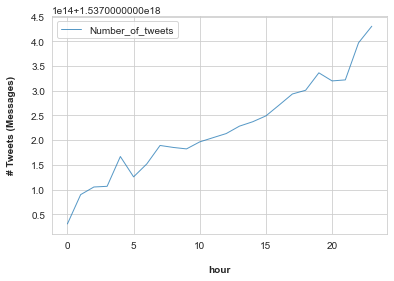

In [103]:
daily_plot = daily_count['Number_of_tweets'].plot(kind='line', lw=1, alpha=0.75, legend=True, x_compat=True)
daily_plot.set_xlabel('hour', weight='bold', labelpad=15)    #SET X-AXIS LABEL; ADD PADDING TO TOP OF LABEL
daily_plot.set_ylabel('# Tweets (Messages)', weight='bold', labelpad=15) #SET Y-AXIS LABEL; ADD PADDING TO RIGHT OF LABEL

The Fig.4.1   shows that the tweet trends tend to be increasing, bit of sporadic in between. This shows that people tweets very less during first 5 hour of the day as it is obvious that they usually sleep at that time. As the day progress , the number of tweets increases.

comment on what you see
I can see the average number of tweets is increasing monotonously with number of hours. Early hours, people prefer to tweets less as they might be
sleeping at that time , as soon as day progress, people indulge in tweeting.

Part 2. Users (20 marks)
1. Make a histogram with the number of users on the y-axis and number of
tweets they make on the x-axis. Discuss the distribution that you see. All the
users in the data set should be included! [5 marks]



In [4]:
if __name__ == "__main__": # Pool works only when using this if statement
    t = time.time()
    with Pool(10) as pool:
        # print(list_of_zip_folders[0])
        question2= pool.map(ques_op2, dir_list(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment\twitter_data"))
    print((time.time() - t)/60)

6.8012921412785845


In [5]:
type(question2)
question2[0:10]
# len(lister(question2))   #without duplicates
# len(question2)

[(('1531772510450208769', '127625257', 'valerievalentin'),
  ('1531772510701748225', '1092190045', 'rh_neukoelln'),
  ('1531772513306525696', '28993079', 'mosb45'),
  ('1531772513809842176', '867134762', 'dangobb'),
  ('1531772514262831104', '635624391', 'MrRichi94'),
  ('1531772514749366274', '2858863684', 'sulsitodisimone'),
  ('1531772515672006656', '1320306297384980481', 'NobbsPaddy'),
  ('1531772516359864320', '1483902423504723974', 'abdenourandrze1'),
  ('1531772515806326786', '3253129941', 'bellazabelle'),
  ('1531772516049780737', '1426618151303778305', 'Arash_zrei'),
  ('1531772517534294018', '25709138', 'HanSparkle86'),
  ('1531772517978865665', '95102918', 'Kyiv_time'),
  ('1531772518041849858', '95722016', 'Lviv_time'),
  ('1531772519182647296', '1384110594', 'HoraCatalana'),
  ('1531772519065300992', '584661634', 'TorreRellotge'),
  ('1531772519723814912', '1178504995', 'rbpi_bot'),
  ('1531772520059346948', '520225342', 'LSZHMETAR'),
  ('1531772520646549506', '31567867', 

In [6]:
type(question2)
x = intialdata(question2)
# # type(data_ques2)
# data_ques2[0:10]
# print(len(data_ques2))
x
len(x)     ##15040387 without removing duplicates

15040387

In [7]:
data_ques2 = lister(question2)
print(len(data_ques2))
data_ques2[0:10]

15033548


(('1541011504266461185', '954377937448525824', '_ao33_'),
 ('1539230492796633088', '1017245755', 'korvinvlad'),
 ('1538455153136783362', '1266049289400303616', 'andrrrgynous'),
 ('1541056096663740416', '314648805', 'Daniela_A_Gallo'),
 ('1541012097353584640', '45524927', 'RSPCA_Bookshop'),
 ('1541059965514911745', '1234758203243626496', 'salehiseme'),
 ('1534594251832627201', '2957214789', 'Bir_ESK_Dost'),
 ('1538055148215447552', '451564445', 'AydinNursen'),
 ('1537389489026478086', '897821352568250368', 'mario132435'),
 ('1539878114502889474', '1538165654901116930', 'QdamhAlhsn'))

In [ ]:
len(data_ques2)  #15033548  after  removing duplicates

In [ ]:
data_ques2[0:10]
type(data_ques2)

In [8]:
import pandas as pd
df_ques2 = pd.DataFrame(list(data_ques2), columns= ["tweets_id","user_id","user_name"])
df_ques2.head()

,tweets_id,user_id,user_name
0,1541011504266461185,954377937448525824,_ao33_
1,1539230492796633088,1017245755,korvinvlad
2,1538455153136783362,1266049289400303616,andrrrgynous
3,1541056096663740416,314648805,Daniela_A_Gallo
4,1541012097353584640,45524927,RSPCA_Bookshop


In [10]:
count_userid = df_ques2.groupby(['user_id','user_name'],group_keys= True).agg('count').rename(columns={"tweets_id":"count_of_tweets"})
count_userid   #753481 , 1

,,count_of_tweets
user_id,user_name,
1000001577812463616,_marta8santos_,2
1000001581012672513,neryskye,2
1000002028825993222,perf_md,5
1000002263325335552,alexisdes_,2
1000003548615266305,1QeQiQ1,56
...,...,...
999998219257106432,sevkiuzn,3
999998758908768257,silvia_1930,3
999999071145398279,djv_vieira,1


from pygments.formatters import img
<img src = "/Users/Utsav Sinha/Desktop/Screenshot 2022-11-24 052203.png" width="1000"/>

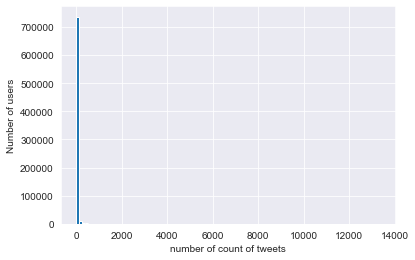

In [13]:
# count_userid.reset_index(inplace=True)   #reset index user_id to user_id column
# print(max(count_userid["count_of_tweets"]))
# count_userid.head(10)
import matplotlib.pyplot as plt
import numpy as np

plt.hist(count_userid["count_of_tweets"],bins = 100)
plt.xlabel("number of count of tweets")
plt.ylabel("Number of users")

# plt.hist(count_userid["tweets_id"],bins = 100)
# plt.xlim(0,1000)
plt.show();

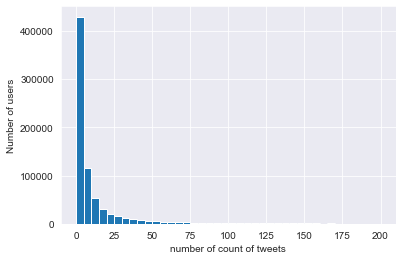

In [15]:
# plt.hist(count_userid["tweets_id"],bins = 100)
# plt.xlim(0,1000)

import matplotlib.pyplot as plt
import numpy as np
bins1= np.arange(0,201,5)
bins1
plt.hist(count_userid["count_of_tweets"],bins1)
plt.xlabel("number of count of tweets")
plt.ylabel("Number of users")
plt.show();

Discuss the distribution that you see. All the users in the data set should be included!
As per the histogram, it reflects that most number of users tweets between range of 0 to 25

2. Find the top-5 users by total number of tweets. Do you think any are
automated accounts (aka. bots)? Justify your answer. [5 marks]


In [16]:
count_userid.columns
count_userid.nlargest(5, 'count_of_tweets')       #top 5 count of the column                              #df.nlargest(3, 'a')

,,count_of_tweets
user_id,user_name,
1402775770481713157,Kardeimcin1,13376
1491316688549253120,DailyNews79,12518
954732087235563520,c_antolic,11628
1384110594,HoraCatalana,11294
1069583615762288642,minijobanzeigen,10087


Top top-5 users by total number of tweets. Do you think any are
automated accounts (aka. bots)? Justify your answer. [5 marks]

1402775770481713157 :--  Kardeimcin1
1491316688549253120 : -- DailyNews79
954732087235563520 :--   c_antolic
1384110594  --           HoraCatalana
1069583615762288642  --  minijobanzeigen

m


<img src = "\Users\Utsav Sinha\Desktop\Screenshot 2022-11-22 173523.png" width="1000"/>


3. Find the 5 users who receive the most mentions and comment on this. [5
marks]


In [27]:
import os
os.getcwd()
os.chdir(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment\twitter_data")

In [7]:
# from  zip_extractornew import (dir_list, ques_op23 )
if __name__ == "__main__": # Pool works only when using this if statement
    t = time.time()
    with Pool(10) as pool:
        # print(list_of_zip_folders[0])
        question2= pool.map(ques_op23, dir_list(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment\twitter_data"))
    print((time.time() - t)/60)

6.743911667664846


In [11]:
question2[0:10]

[(('1531772510450208769', None),
  ('1531772510701748225', None),
  ('1531772513306525696', (1473087969829568516,)),
  ('1531772513809842176', (4185660388,)),
  ('1531772514262831104', (902638832675430400,)),
  ('1531772514749366274', None),
  ('1531772515672006656', (775611351792222208,)),
  ('1531772516359864320', None),
  ('1531772515806326786', None),
  ('1531772516049780737', None),
  ('1531772517534294018', (19019465,)),
  ('1531772517978865665', None),
  ('1531772518041849858', None),
  ('1531772519182647296', None),
  ('1531772519065300992', None),
  ('1531772519723814912', None),
  ('1531772520059346948', None),
  ('1531772520646549506', None),
  ('1531772520415866882', None),
  ('1531772520864616450', None),
  ('1531772521678311425', None),
  ('1531772521695129604', None),
  ('1531772523527946240', None),
  ('1531772523125346305', (345020176, 31233554)),
  ('1531772524354228225', None),
  ('1531772525256089600', (1291302591184461824,)),
  ('1531772524790423553', None),
  ('15

In [ ]:
def intialdata(chain_iter):      #removes duplicates of a given key
    return tuple(filter(lambda x: x, (chain(*chain_iter))))

In [10]:
#create function
def cartesian_product(x):
    return zip ()

In [ ]:
map(lambda x: (x.get("id_str")

In [9]:
df_23 = pd.DataFrame(question2, columns=["tw_id","usermention"])
df_23.head()

ValueError: 2 columns passed, passed data had 40734 columns

In [7]:
question2[0:10]
ques2_3 = lister(question2)
ques2_3

(('1541454655531646976', ('1187450895023427584',)),
 ('1532317288866750465', None),
 ('1533728052974436352', None),
 ('1532121128596082688', ('174339596',)),
 ('1535582125990334464', None),
 ('1532816690416914435', None),
 ('1540265764271316992', None),
 ('1540385790198423555', ('1651307083', '26020906', '1670204977')),
 ('1540293386858545153', None),
 ('1538509825746903041', None),
 ('1538766022555099136', ('1442509702487687173',)),
 ('1533579436464947201', ('341314666',)),
 ('1540418568243798016', None),
 ('1542415539775197188', None),
 ('1541440132078772226', ('98470151', '722817978811686913', '160534877')),
 ('1542582988994711553', ('92941377', '819500973232164868')),
 ('1534916870100369408', ('57088229', '923901153326325760')),
 ('1531857544976683008', ('1354422356656218113',)),
 ('1535543624166830080', None),
 ('1537714742755729410', ('2530457449',)),
 ('1535294871464038400', ('465403720', '192318065')),
 ('1535602023529332736', None),
 ('1540533103965396993', None),
 ('153661466

In [5]:
len(ques2_3)

NameError: name 'ques2_3' is not defined

In [15]:
ques2_3.explode(column = ["x","y"])

AttributeError: 'tuple' object has no attribute 'explode'

In [8]:
user_mention_rd = lister(ques2_3)
len(user_mention_rd)

18505311

In [13]:
user_mention_rd[0:20]

('1540681473140748288',
 '1541194509333282816',
 ('1156665460856893442', '1283933652766752769'),
 '1538239330971426822',
 '1533395910515904512',
 ('377279652',),
 ('1309763783510822914',),
 '1538248833125257224',
 '1542045033112768512',
 ('623097417',),
 '1538275562183081985',
 '1541244127509204992',
 '1538930564518006786',
 '1537156626519580677',
 '1536213790026498050',
 '1536769289444900864',
 '1542213859506896896',
 '1541654624469401601',
 '1533798108412493826',
 '1539627862138945536')

In [10]:
df_23 = pd.DataFrame(user_mention_rd, columns=["tw_id","usermention"])
df_23.head()

ValueError: Shape of passed values is (18505311, 1), indices imply (18505311, 2)

In [8]:
list_user_mention = list(chain.from_iterable(ques2_3))

In [10]:
list_user_mention[0:10]

['296756458',
 '224660508',
 '423384542',
 '213754264',
 '1022393844111945728',
 '930023902851616769',
 '759655016978415617',
 '3296541463',
 '1474850029697482758',
 '1171345525028864001']

In [11]:
user_mention_count = Counter(list_user_mention)

In [12]:
user_mention_count

Counter({'296756458': 430,
         '224660508': 216,
         '423384542': 633,
         '213754264': 655,
         '1022393844111945728': 3,
         '930023902851616769': 1,
         '759655016978415617': 1,
         '3296541463': 75,
         '1474850029697482758': 8,
         '1171345525028864001': 1,
         '3216970389': 1,
         '1029726689432154112': 521,
         '1397418582': 3,
         '360987747': 16,
         '1447899912214130692': 31,
         '1517837901438013440': 20,
         '731535920579678209': 11,
         '1319523041035096065': 221,
         '1146329871418843136': 788,
         '155507136': 745,
         '28076891': 662,
         '1220458397776207879': 1,
         '1379526403578806280': 100,
         '1474693536': 19,
         '1519827444517195777': 1,
         '797286998549626880': 1,
         '1530906316893474817': 3,
         '2379079607': 14,
         '283685612': 6,
         '196332808': 7,
         '1278749932296572928': 13,
         '228878289': 21,
 

In [14]:
dict(Counter(user_mention_count).most_common(5))

{'3131144855': 6218,
 '68034431': 4807,
 '10228272': 4430,
 '26020906': 3639,
 '44196397': 3340}

In [16]:
import heapq
heapq.nlargest(5, user_mention_count, key=user_mention_count.get)

['3131144855', '68034431', '10228272', '26020906', '44196397']

3131144855 => @BorisJohnson
68034431 => @RTErdogan
10228272 => @YouTube
26020906 => @RMTunion
44196397 => @elonmusk


4. Choose 4 countries and compute how often they mention each other. This
means you should compute 16 numbers e.g. UK mentions UK, UK mentions
France, France mentions UK etc. Comment on any patterns you observe. [5
marks]


In [3]:
if __name__ == "__main__": # Pool works only when using this if statement
    t = time.time()
    with Pool(6) as pool:
        question3 = pool.map(ques_op24, dir_list(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment\twitter_data"))
    print((time.time() - t)/60)

AttributeError: 'NoneType' object has no attribute 'get'

In [5]:
question3[0:5]

[(('1531772510450208769', '127625257'),
  ('1531772510701748225', '1092190045'),
  ('1531772513306525696', '28993079'),
  ('1531772513809842176', '867134762'),
  ('1531772514262831104', '635624391'),
  ('1531772514749366274', '2858863684'),
  ('1531772515672006656', '1320306297384980481'),
  ('1531772516359864320', '1483902423504723974'),
  ('1531772515806326786', '3253129941'),
  ('1531772516049780737', '1426618151303778305'),
  ('1531772517534294018', '25709138'),
  ('1531772517978865665', '95102918'),
  ('1531772518041849858', '95722016'),
  ('1531772519182647296', '1384110594'),
  ('1531772519065300992', '584661634'),
  ('1531772519723814912', '1178504995'),
  ('1531772520059346948', '520225342'),
  ('1531772520646549506', '31567867'),
  ('1531772520415866882', '4643841555'),
  ('1531772520864616450', '4052619675'),
  ('1531772521678311425', '3076795847'),
  ('1531772521695129604', '379375396'),
  ('1531772523527946240', '81137572'),
  ('1531772523125346305', '450740445'),
  ('1531

Part 3
1.Draw a map of Europe that displays the use of Twitter across the continent.

Use only the GPS-tagged tweets, these are tweets which have a
“coordinates” field in the metadata.                                               :- #taken coordinate of the json files
The exact form of the map is up to you:
marks will be given for accuracy, clarity and presentation. [10 marks]


In [5]:
if __name__ == "__main__": # Pool works only when using this if statement
    t = time.time()
    with Pool(6) as pool:
        question3 = pool.map(ques_op3, dir_list(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment\twitter_data"))
    print((time.time() - t)/60)

7.212502352396647


In [6]:
data_ques_3 = lister(question3)
data_ques_3[0:10]

((41.037263, 28.96827),
 (42.66465948, 21.15503043),
 (45.95261, 8.47936),
 (43.32279968, -3.05599999),
 (51.38697637, -0.4529965),
 (43.55638889, -7.04166667),
 (41.037863, 28.96825),
 (54.94248845, 20.15601562),
 (41.037366, 28.968398),
 (47.0075, 7.364))

In [7]:
is2s = map(lambda x: x.get('cc'), rg.search(data_ques_3))

Loading formatted geocoded file...


In [9]:
import numpy as np
county_code = np.array(tuple(is2s))

In [10]:
county_code[county_code == 'XK'] = 'RS'  #serbia
county_code[county_code == 'AX'] = 'FI'  #Finland
county_code = tuple(county_code.tolist())
county_code = iso2_to_name(county_code, to="iso3")
county_code_count = Counter(county_code)

In [35]:
df = pd.DataFrame({"country":county_code_count.keys(), 'no_of_tweets': county_code_count.values()})

In [18]:
import os
os.getcwd()
# os.chdir(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment")

'D:\\UOE MODULES PYTHON DIRECTORy_codes\\IDS\\assignment'

In [31]:
with open("ids.geo-2.json",encoding="utf-8") as geo_j:
    countries = json.load(geo_j)

In [ ]:
# countries

In [ ]:
# lis = []
# for x in countries['features']:
#     lis.append(x['properties']['iso_a3'])
    # print(x['properties'])  if x['properties']['name'] == 'Vatican' else 'not'

In [ ]:
# lis

In [ ]:
# for x in df.NAME.unique():
#     print(x, 'in') if x in lis else print(x, 'not')

In [36]:
fig = px.choropleth(df,locations='country',geojson=countries, color='no_of_tweets',featureidkey='properties.ISO3_CODE', color_continuous_scale="rainbow")
fig.update_geos(fitbounds='geojson',visible=False,)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

3.2 Explain any patterns you observe. [5 marks]


3.3 The rest of the tweets should have a “place” tag. For these tweets, plot the
    CDF of the bounding box diagonals and comment. [5 marks]


In [6]:
if __name__== "__main__": # Pool works only when using this if statement
    with Pool(8) as pool:
        question3_3 = pool.map(ques_op3_3, dir_list(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment\twitter_data"))

In [9]:
def lister1(chain_iter):          #removes duplicates (Property of set:- A set does not have duplicates)
    return tuple(filter(lambda x: x, chain(*chain_iter)))   #this stuff is unhashable
question33 = lister1(question3_3)

In [10]:
import geopandas
question33_gp = geopandas.GeoDataFrame(question33, columns=['tweet_id','geometry'])

In [11]:
question33_gp

,tweet_id,geometry
0,1531772510450208769,"POLYGON ((-0.22859 51.47722, -0.22859 51.53035..."
1,1531772513306525696,"POLYGON ((27.32948 38.60342, 27.32948 38.64453..."
2,1531772513809842176,"POLYGON ((11.82242 45.32692, 11.82242 45.38387..."
3,1531772514262831104,"POLYGON ((-0.43255 39.27838, -0.43255 39.56659..."
4,1531772514749366274,"POLYGON ((8.91667 44.45084, 8.91667 44.50777, ..."
...,...,...
15033599,1542644142123220993,"POLYGON ((28.63210 40.80273, 28.63210 41.23991..."
15033600,1542644142613880832,"POLYGON ((-6.38744 53.29874, -6.38744 53.41106..."
15033601,1542644143679328256,"POLYGON ((20.85255 52.09771, 20.85255 52.36796..."
15033602,1542644144945987584,"POLYGON ((-6.16229 36.24254, -6.16229 36.35219..."


In [12]:
data33_after_remove_dup = question33_gp.drop_duplicates()
data33_after_remove_dup.shape

(15026765, 2)

In [14]:
import numpy as np
diagonal = ((data33_after_remove_dup.area**2 / data33_after_remove_dup.length**2) + data33_after_remove_dup.length**2).apply(np.sqrt)
#magnitude of the diagonals

In [15]:
data33_after_remove_dup['diagonal'] = diagonal

C:\Users\Utsav Sinha\anaconda3\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<AxesSubplot:>

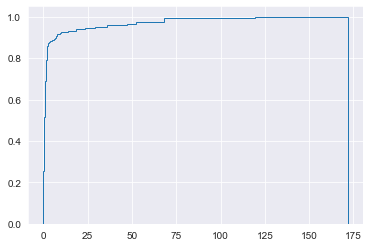

In [16]:
##Jo
diagonal.hist(bins=500, histtype='step', cumulative=1, density=1)   #density

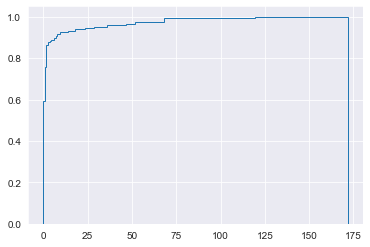

In [20]:
#ut
import matplotlib.pyplot as plt
plt.hist(data33_after_remove_dup['diagonal'], bins=200,cumulative=True , histtype= "step" , density = True)
#density :-changing y axis(count/divide by total) so ranges from 0 to 1
#histtype :- removing color
#commulative
plt.show()

4.4 Find one additional spatial dataset, produce a map comparing Twitter activity
with the other dataset and discuss. Your secondary dataset doesn’t have to
cover the entire bounding box e.g. it could be for a single city or nation. [10
marks]


In [ ]:
### Example :- based on cooridnate you will get nearest cities
# import reverse_geocoder as rg
# coordinates = (51.5214588,-0.1729636),(9.936033, 76.259952),(37.38605,-122.08385)
# rg.search(coordinates)
# [{'name': 'Bayswater',
#   'cc': 'GB',
#   'lat': '51.51116',
#   'lon': '-0.18426',
#   'admin1': 'England',
#   'admin2': 'Greater London'},
#  {'name': 'Cochin',

In [35]:
all_cities_names = iso2_to_name(coordiante_to_cities, to="name")
print(all_cities_names)   #name of the cities based on cc

['Turkey', 'Kosovo', 'Italy', 'Spain', 'United Kingdom', 'Spain', 'Turkey', 'Russia', 'Turkey', 'Switzerland', 'Turkey', 'Turkey', 'United Kingdom', 'Belgium', 'Latvia', 'Turkey', 'Turkey', 'Denmark', 'United Kingdom', 'France', 'Turkey', 'Spain', 'Germany', 'United Kingdom', 'Netherlands', 'Italy', 'Spain', 'Netherlands', 'France', 'United Kingdom', 'Germany', 'Turkey', 'Switzerland', 'United Kingdom', 'Greece', 'Turkey', 'Turkey', 'Turkey', 'Turkey', 'Spain', 'United Kingdom', 'Italy', 'Spain', 'France', 'Turkey', 'Luxembourg', 'Finland', 'United Kingdom', 'Turkey', 'Russia', 'Netherlands', 'Turkey', 'Turkey', 'Greece', 'Turkey', 'Russia', 'Turkey', 'Turkey', 'Turkey', 'Italy', 'Turkey', 'Turkey', 'Italy', 'Romania', 'Netherlands', 'Germany', 'Russia', 'United Kingdom', 'Turkey', 'Italy', 'France', 'Turkey', 'Spain', 'Italy', 'Iran', 'Netherlands', 'Georgia', 'Italy', 'Spain', 'Spain', 'France', 'United Kingdom', 'Turkey', 'Belgium', 'Spain', 'Germany', 'Turkey', 'United Kingdom', 'G

In [36]:
############dict of cities name (city in europe along with numbers of their presence in data
dict_of_cities_name = Counter(all_cities_names)
dict_of_cities_name

Counter({'Turkey': 69824,
         'Kosovo': 71,
         'Italy': 13945,
         'Spain': 18405,
         'United Kingdom': 36723,
         'Russia': 3487,
         'Switzerland': 2297,
         'Belgium': 4084,
         'Latvia': 241,
         'Denmark': 1145,
         'France': 15249,
         'Germany': 14279,
         'Netherlands': 15063,
         'Greece': 3767,
         'Luxembourg': 287,
         'Finland': 1754,
         'Romania': 1042,
         'Iran': 953,
         'Georgia': 303,
         'Hungary': 824,
         'Uzbekistan': 126,
         'Estonia': 307,
         'Austria': 1635,
         'Ukraine': 782,
         'Portugal': 2683,
         'Czech Republic': 2797,
         'Belarus': 373,
         'Ireland': 6063,
         'Norway': 1334,
         'Syria': 88,
         'Slovakia': 329,
         'Kazakhstan': 239,
         'Afghanistan': 156,
         'Poland': 2424,
         'Morocco': 95,
         'Serbia': 540,
         'Sweden': 2776,
         'Slovenia': 339,
      

In [56]:
df_map = pd.DataFrame({"NAME":dict_of_cities_name.keys(), 'tweets': dict_of_cities_name.values()})
df_map.head()

,NAME,tweets
0,Turkey,69824
1,Kosovo,71
2,Italy,13945
3,Spain,18405
4,United Kingdom,36723


In [14]:
import os
os.getcwd()
os.chdir(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment")

In [15]:
with open("europe.geo.json") as geo_j:
    countries = json.load(geo_j)

In [50]:
countries

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'FID': 0.0,
    'FIPS': 'AJ',
    'ISO2': 'AZ',
    'ISO3': 'AZE',
    'UN': 31,
    'NAME': 'Azerbaijan',
    'AREA': 8260,
    'POP2005': 8352021,
    'REGION': 142,
    'SUBREGION': 145,
    'LON': 47.395,
    'LAT': 40.43},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[45.083321, 39.768044000000145],
       [45.266388, 39.61110700000012],
       [45.319984, 39.546944],
       [45.326096, 39.538322],
       [45.330826000000116, 39.535271],
       [45.457497, 39.49360700000011],
       [45.47248100000013, 39.494431],
       [45.49694, 39.502213],
       [45.507767, 39.506653],
       [45.5283280000001, 39.517212],
       [45.558327, 39.53387500000014],
       [45.59054600000013, 39.54861],
       [45.60777, 39.554703],
       [45.626656, 39.55999],
       [45.725266, 39.57972],
       [45.732201000000146, 39.580544000000145],
       [45.740822, 39.57972],
       [45.755272, 39.576653],


In [37]:
# fig = px.choropleth(df_map,locations="NAME",color="tweets", geojson=countries, featureidkey='properties.NAME',color_continuous_scale="rainbow")# color_continuous_scale=px.colors.sequential.matter)
# fig.update_geos(fitbounds="locations",visible=False)
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# fig.show()

2. Explain any patterns you observe. [5 marks]

Part 4. Events (20 marks)
1. Identify 3 days with unusually high activity in 3 different countries of your
choosing. For example you could choose one day in the UK, one in France
and one in Turkey. Describe and justify how you identify ‘unusual’ days. [5
marks]


In [4]:
if __name__ == "__main__": # Pool works only when using this if statement
    t = time.time()
    with Pool(6) as pool:
        question4 = pool.map(ques_op4_4, dir_list(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment\twitter_data"))
    print((time.time() - t)/60)

11.627448062102


In [5]:
question4[0:5]

[(('1531772510450208769',
   'Tue May 31 23:00:00 +0000 2022',
   'https://t.co/B3K8DCQpXg',
   'GB'),
  None,
  ('1531772513306525696',
   'Tue May 31 23:00:00 +0000 2022',
   '@nurse_hmsre Hayır akepe yi aya gönder mek',
   'TR'),
  ('1531772513809842176',
   'Tue May 31 23:00:00 +0000 2022',
   '@gigi52335676 Ci riprenderemo le colonie e anche la Crimea 😏🦧',
   'IT'),
  ('1531772514262831104',
   'Tue May 31 23:00:01 +0000 2022',
   '@rompelavabos No me consta, eso qué es? 😂😂😂 https://t.co/ztMDb5YmtF',
   'ES'),
  ('1531772514749366274',
   'Tue May 31 23:00:01 +0000 2022',
   '01:00\nTemp. 15,0°C App. 15,9°C\nUmid. 95% \nPioggia/Rain 0,0 mm 0,0 mmh\nVento/wind 3,6 Kmh NE F1 Max 3,6 Kmh\nPress. 1… https://t.co/ZBsv0cYtOD',
   'IT'),
  ('1531772515672006656',
   'Tue May 31 23:00:01 +0000 2022',
   "@RosyChipshop You and a couple of Puritan trots who despise happiness &amp; believe joy must be punished--that's it I'm… https://t.co/AjPaoKLytE",
   'GB'),
  ('1531772516359864320',
   '

In [8]:
len(question4)

720

In [7]:
no_of_unique_tweets1  = removedup(question4)
no_of_unique_tweets1

(('1533727234279804929',
  'Mon Jun 06 08:27:22 +0000 2022',
  '@_blue_birrd یه جا خوندم نوشته بود شهره لرستانی تو نوجوانی شکست عشقی خورده دیگه ازدواج نکرده الان با گربه هاش زندگی میکنه🤦\u200d♀️🤦\u200d♀️🤦\u200d♀️🤦\u200d♀️',
  'IR'),
 ('1535956203301490688',
  'Sun Jun 12 12:04:30 +0000 2022',
  'Feels good to be back in #Norway. 🥰 🇳🇴 #LifeInNorway',
  'NO'),
 ('1537735161718181890',
  'Fri Jun 17 09:53:26 +0000 2022',
  '@RogerMelian @McRaffa sí dan ganas se responder así jajajaja',
  'GB'),
 ('1534662090157342723',
  'Wed Jun 08 22:22:09 +0000 2022',
  "@AutoPap @AdamAfriyie The Tories have given you 5p off a litre. I don't know some people, never happy 🙄",
  'GB'),
 ('1539539699261493249',
  'Wed Jun 22 09:24:02 +0000 2022',
  '@snowleopardess Any time he leaves if fine by me',
  'GB'),
 ('1534774859242283008',
  'Thu Jun 09 05:50:15 +0000 2022',
  '@The_Crobees @AristoDogNFT @JaffaXRP @RiddlerXrp @JohnBlomli',
  'NO'),
 ('1535854008644120576',
  'Sun Jun 12 05:18:25 +0000 2022',
  '

In [ ]:
len(no_of_unique_tweets1)

In [ ]:
import pandas as pd
df4_2 = pd.DataFrame(no_of_unique_tweets1, columns=["twt_id","created_at","tweet_text","country_code"])
df4_2.head()

#unusual days in UK
24th June :- 133194

#unusual days in fRANCE
19th June :- 41537

##unusual days in Turkey
28TH June :- 94551

In [ ]:
df4_2.tail()

In [ ]:
df4_2.shape()

In [ ]:
df4_2[['created_at']] = df4_2[['created_at']].apply(pd.to_datetime)

In [ ]:
df4_2['time_local'] = df4_2['created_at'].dt.tz_convert('Europe/London')
df4_2.head()

In [ ]:
print(df4_2['time_local'].agg(['min', 'max']))
df4_2['day']= df4_2['time_local'].dt.day  #day
df4_2.head()

In [ ]:
df4_2.to_csv(r"D:\UOE MODULES PYTHON DIRECTORy_codes\IDS\assignment\export files\question4.csv")

In [ ]:
############################################################UK #################################################
df4_UK1 = df4_2.loc[(df4_2["country_code"] == "GB")]
df4_UK1.shape  #3511478

df4_UK_24thjune = df4_UK1.loc[(df4_2["day"] == 24)]
df4_UK_24thjune.shape  #133194

In [ ]:
####################################################fRANCE #############################################
df4_FR1 = df4_2.loc[(df4_2["country_code"] == "FR")]
df4_FR1.shape  ###1081186

df4_France_19thjune = df4_FR1.loc[(df4_2["day"] == 19)]
df4_France_19thjune.shape  #41537

In [ ]:
####################################################Turkey #############################################
df4_TR1 = df4_2.loc[(df4_2["country_code"] == "TR")]
df4_TR1.shape  ###1081186

df4_TR1_28thjune = df4_TR1.loc[(df4_2["day"] == 28)]
df4_TR1_28thjune.shape  #41537

In [ ]:
df4_UK12  = df4_UK1.drop(['country_code', 'created_at',"time_local","twt_id"], axis=1)
df4_UK12.head()   # text

In [ ]:
##Step-1: Removing emojis and symbols
import re
a = df.loc[1272].to_string() #loads the row from dataframe  #random row
print(a)

#The following pattern will remove most emoticons and symbols in the text.
regex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags = re.UNICODE)
match = re.sub(regex_pattern,'',a) #replaces pattern with ''
print(match)

In [ ]:
####Step-2: Removing urls
a = df.loc[0].to_string()
print(a)


In [ ]:
# The below block of code removes urls from the text.
pattern = re.compile(r'(https?://)?(www\.)?(\w+\.)?(\w+)(\.\w+)(/.+)?')
match = re.sub(pattern,'',a)
print(match)

In [ ]:
#Step-3: Removing @mentions and hash symbols
a = df.loc[3].to_string()
print(a)

In [ ]:
##The following block removes @mentions and hashes from the text.
import Za
re_list = ["@[A-Za-z0–9_]+", '#']
combined_re = re.compile( '|'.join( re_list) )
match = re.sub(combined_re," ",a)
print(match)

In [ ]:
###Step-4: HTML to text
from bs4 import BeautifulSoup
a = df.loc[27].to_string()
print(a)


In [ ]:
##The block below will remove html characters from the text.
del_amp = BeautifulSoup(a, 'lxml')
del_amp_text = del_amp.get_text()
print(del_amp_text)

In [ ]:
#########Now we will aggregate all these steps into a function cleaning_tweets(). Additionally we will tokenise the words to remove white spaces. Also all the words will be converted to lowercase to avoid same words like ‘Falcon’ & ‘falcon’ appearing in the wordcloud. We will also consider only those words which have at least three characters.

from bs4 import BeautifulSoup
from nltk.tokenize import WordPunctTokenizer
token = WordPunctTokenizer()
def cleaning_tweets(t):
    del_amp = BeautifulSoup(t, 'lxml')
    del_amp_text = del_amp.get_text()
    del_link_mentions = re.sub(combined_re, '', del_amp_text)
    del_emoticons = re.sub(regex_pattern, '', del_link_mentions)
    lower_case = del_emoticons.lower()
    words = token.tokenize(lower_case)
    result_words = [x for x in words if len(x) > 2]
    return (" ".join(result_words)).strip()

In [ ]:
#Now pass the dataframe into our function and clean the text. The function will return a list of cleaned tweets. You can see progress of the process in the output window.

In [ ]:
print("Cleaning the tweets...\n")
cleaned_tweets = []
for i in range(0,3000): #3000 columns in our dataframe
    if( (i+1)%100 == 0 ):
        print("Tweets {} of {} have ben processed".format(i+1,3000))
    cleaned_tweets.append(cleaning_tweets((df.Text[i])))

In [ ]:
#Next we will use pandas.Series.str.cat() to concatenate the strings in the list cleaned_tweets separated by ‘ ‘.
string = pd.Series(cleaned_tweets).str.cat(sep=' ')

In [ ]:
###Generating Word Cloud:
# In this last section, we will use wordcloud library of python to generate word cloud of the tweets.
#
# Stopwords are the commonly occurring words in English language such as “the”, “a”, “an”, “in”… that don’t add much meaning to sentences. These words are ignored in natural language processing tasks. We can add our own stopwords as per our need. We know the words like “elonmusk”,”elon musk”,”elon”,”musk”… will be very common in tweets with hashtag #SpaceX. So we add them to stopwords list and they won’t appear in the word cloud.


In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)
stopwords.update(["elonmusk","elon musk","elon","musk","spacex"]) #adding our own stopwords

In [ ]:
#In the WordCloud() function, we can pass arguments as per our requirements.

# max_words:200 words is default value; 50–100 words are recommended so that we our word cloud is clean and legible.
# collocations: Default value is True. We will choose False to avoid bigrams of words.
# background_color: Use any color you wish to have like 'blue', ‘green’,’grey’…Black is default value.
# Finally we generate our word cloud with this block of code. You can play with the arguments in WordCloud() function to generate clouds of different colors and sizes.

In [ ]:
wordcloud = WordCloud(width=1600, stopwords=stopwords,height=800,max_font_size=200,max_words=50,collocations=False, background_color='black').generate(string)
plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [ ]:
####Looking at the above cloud, we can see what words are mentioned with #SpaceX — starlink,space, nasa, falcon9 etc. Bigger the size of the word, the more frequent they occur in the tweets.

In [ ]:
############now we have to make each of these three days (Making a word cloud from the tweet text)
### UK 24TH JUNE


In [ ]:
data1.loc[(data1['dayofweek'].isin([5,6]) ), 'weekday_weekend'] = 'weekend'
data1.loc[(data1['dayofweek'].isin([0,1,2,3,4]) ), 'weekday_weekend'] = 'weekday'
data1.head(10)

In [17]:
import json
x = {
  "timestamp_ms": "1654038000105",
    "id_str": "1531772510450208769",
	"created_at": "Tue May 31 23:00:00 +0000 2022",
	"place": {
    	"country": "Royaume-Uni",
		"name": "Kensington",
		"full_name": "Kensington, London",
		"country_code": "GB",
	        }
}
y = json.dumps(x)

In [18]:
y

'{"timestamp_ms": "1654038000105", "id_str": "1531772510450208769", "created_at": "Tue May 31 23:00:00 +0000 2022", "place": {"country": "Royaume-Uni", "name": "Kensington", "full_name": "Kensington, London", "country_code": "GB"}}'

In [19]:
y.get("place").get("country_code")

AttributeError: 'str' object has no attribute 'get'

In [20]:
def dummy(element):
    return (element.get('id_str'),element.get("timestamp_ms") , (element.get('place').get("country_code"))) if  element.get('id_str') else None

In [23]:

dummy(y)

AttributeError: 'str' object has no attribute 'get'

AttributeError: 'str' object has no attribute 'get'